In [1]:
import pandas as pd
import os
import ast
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
from sklearn.decomposition import PCA 
from sklearn.preprocessing import *
import numpy as np

from sklearn.feature_selection import *
import librosa

In [2]:
# paths for the data

DATA_PATH = "/kaggle/input/fma-small/"
METADATA_PATH = DATA_PATH + "fma_metadata/fma_metadata/"
FMA_SMALL_PATH = DATA_PATH + "fma_small/fma_small/"
FIG_SIZE = (20, 20)

In [3]:
os.listdir(METADATA_PATH)

['echonest.csv',
 'raw_genres.csv',
 'raw_artists.csv',
 'features.csv',
 'genres.csv',
 'README.txt',
 'not_found.pickle',
 'tracks.csv',
 'raw_tracks.csv',
 'raw_albums.csv',
 'raw_echonest.csv',
 'checksums']

In [4]:
def load(filepath):

    filename = os.path.basename(filepath)

    if 'features' in filename:
        return pd.read_csv(filepath, index_col=0, header=[0, 1, 2])

    if 'echonest' in filename:
        return pd.read_csv(filepath, index_col=0, header=[0, 1, 2])

    if 'genres' in filename:
        return pd.read_csv(filepath, index_col=0)

    if 'tracks' in filename:
        tracks = pd.read_csv(filepath, index_col=0, header=[0, 1])

        COLUMNS = [('track', 'tags'), ('album', 'tags'), ('artist', 'tags'),
                   ('track', 'genres'), ('track', 'genres_all'),
                   ('track', 'genres_top')]
        for column in COLUMNS:
            tracks[column] = tracks[column].map(ast.literal_eval)

        COLUMNS = [('track', 'date_created'), ('track', 'date_recorded'),
                   ('album', 'date_created'), ('album', 'date_released'),
                   ('artist', 'date_created'), ('artist', 'active_year_begin'),
                   ('artist', 'active_year_end')]
        for column in COLUMNS:
            tracks[column] = pd.to_datetime(tracks[column])

        SUBSETS = ('small', 'medium', 'large')
        tracks['set', 'subset'] = tracks['set', 'subset'].astype(
                'category', categories=SUBSETS, ordered=True)

        COLUMNS = [('track', 'license'), ('artist', 'bio'),
                   ('album', 'type'), ('album', 'information')]
        for column in COLUMNS:
            tracks[column] = tracks[column].astype('category')

        return tracks

In [13]:
def get_audio_path(audio_dir, track_id):
    """
    Return the path to the mp3 given the directory where the audio is stored
    and the track ID.
    Examples
    --------
    >>> import utils
    >>> AUDIO_DIR = os.environ.get('AUDIO_DIR')
    >>> utils.get_audio_path(AUDIO_DIR, 2)
    '../data/fma_small/000/000002.mp3'
    """
    tid_str = '{:06d}'.format(track_id)
    return os.path.join(audio_dir, tid_str[:3], tid_str + '.mp3')

# **Plots for random audio**

STFT hop length duration is: 0.023219954648526078s
STFT window duration is: 0.09287981859410431s
STFT hop length duration is: 0.023219954648526078s
STFT window duration is: 0.09287981859410431s


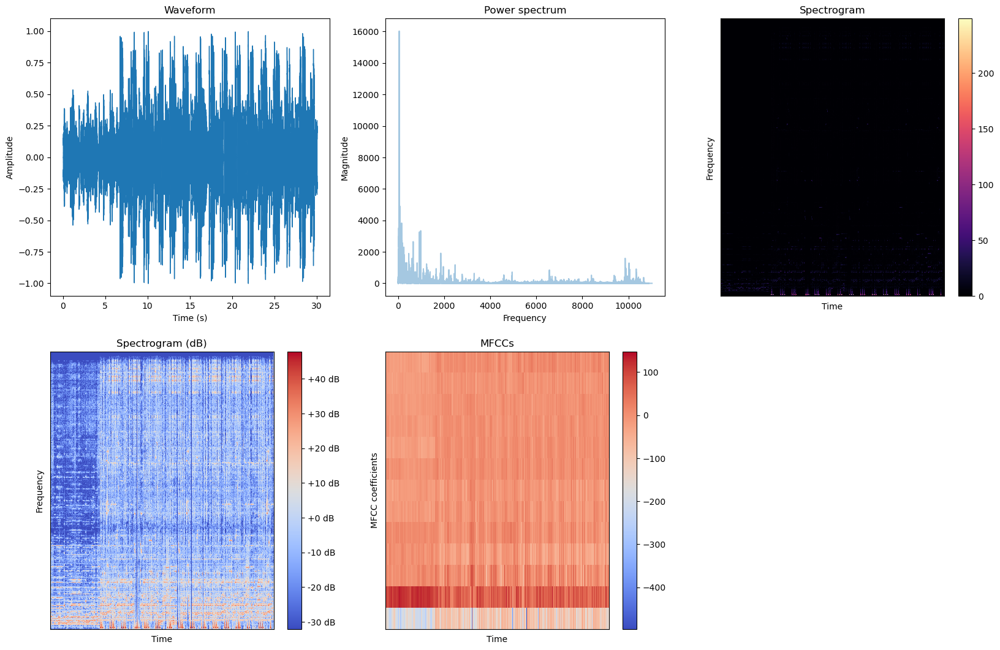

In [31]:
import warnings
warnings.filterwarnings("ignore")

def plot_waveform(filename): 
    
    signal, sample_rate = librosa.load(filename, sr=22050)

    plt.figure(figsize=FIG_SIZE)
    plt.subplot(3, 3, 1)
    librosa.display.waveshow(signal)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title("Waveform")
    
def plot_spectrum(filename):
    signal, sample_rate = librosa.load(filename, sr=22050)
    fft = np.fft.fft(signal)
    # calculate abs values on complex numbers to get magnitude
    spectrum = np.abs(fft)

    # create frequency variable
    f = np.linspace(0, sample_rate, len(spectrum))

    # take half of the spectrum and frequency
    left_spectrum = spectrum[:int(len(spectrum)/2)]
    left_f = f[:int(len(spectrum)/2)]

    # plot spectrum
    plt.subplot(3, 3, 2)
   # plt.figure(figsize=FIG_SIZE)
    plt.plot(left_f, left_spectrum, alpha=0.4)
    plt.xlabel("Frequency")
    plt.ylabel("Magnitude")
    plt.title("Power spectrum")
    

def plot_spectrogram(filename): 
    signal, sample_rate = librosa.load(filename, sr=22050)
    hop_length = 512 # in num. of samples
    n_fft = 2048 # window in num. of samples

    # calculate duration hop length and window in seconds
    hop_length_duration = float(hop_length)/sample_rate
    n_fft_duration = float(n_fft)/sample_rate

    print("STFT hop length duration is: {}s".format(hop_length_duration))
    print("STFT window duration is: {}s".format(n_fft_duration))

    # perform stft
    stft = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length)

    # calculate abs values on complex numbers to get magnitude
    spectrogram = np.abs(stft)

    # display spectrogram
    plt.subplot(3, 3, 3)
    librosa.display.specshow(spectrogram, sr=sample_rate, hop_length=hop_length)
    plt.xlabel("Time")
    plt.ylabel("Frequency")
    plt.colorbar()
    plt.title("Spectrogram")
    

def plot_log_spectrogram(filename):
    signal, sample_rate = librosa.load(filename, sr=22050)
    hop_length = 512 # in num. of samples
    n_fft = 2048 # window in num. of samples

    # calculate duration hop length and window in seconds
    hop_length_duration = float(hop_length)/sample_rate
    n_fft_duration = float(n_fft)/sample_rate

    print("STFT hop length duration is: {}s".format(hop_length_duration))
    print("STFT window duration is: {}s".format(n_fft_duration))

    # perform stft
    stft = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length)

    # calculate abs values on complex numbers to get magnitude
    spectrogram = np.abs(stft)
    # apply logarithm to cast amplitude to Decibels
    log_spectrogram = librosa.amplitude_to_db(spectrogram)

 #   plt.figure(figsize=FIG_SIZE)
    plt.subplot(3, 3, 4)
    librosa.display.specshow(log_spectrogram, sr=sample_rate, hop_length=hop_length)
    plt.xlabel("Time")
    plt.ylabel("Frequency")
    plt.colorbar(format="%+2.0f dB")
    plt.title("Spectrogram (dB)")


def plot_mfcc(filename): 
    hop_length = 512 # in num. of samples
    n_fft = 2048 # window in num. of samples

    # calculate duration hop length and window in seconds
    hop_length_duration = float(hop_length)/sample_rate
    n_fft_duration = float(n_fft)/sample_rate
    MFCCs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_fft=n_fft, hop_length=hop_length, n_mfcc=13)

    # display MFCCs
   # plt.figure(figsize=FIG_SIZE)
    plt.subplot(3, 3, 5)
    librosa.display.specshow(MFCCs, sr=sample_rate, hop_length=hop_length)
    plt.xlabel("Time")
    plt.ylabel("MFCC coefficients")
    plt.colorbar()
    plt.title("MFCCs")

    # show plots
    plt.show()

    
f = get_audio_path(FMA_SMALL_PATH, 36096)
plot_waveform(f)
plot_spectrum(f)
plot_spectrogram(f)
plot_log_spectrogram(f)
plot_mfcc(f)

In [16]:
filepath = METADATA_PATH + 'tracks.csv'
tracks = pd.read_csv(filepath, index_col=0, header=[0, 1])
keep_cols = [('set', 'split'),
('set', 'subset'),('track', 'genre_top')]

df_all = tracks[keep_cols]
df_all = df_all[df_all[('set', 'subset')] == 'small']

df_all['track_id'] = df_all.index
df_all.head()

set            track track_id
             split subset genre_top         
track_id                                    
2         training  small   Hip-Hop        2
5         training  small   Hip-Hop        5
10        training  small       Pop       10
140       training  small      Folk      140
141       training  small      Folk      141

In [17]:
grouped_df = df_all.groupby(('track', 'genre_top')).first().reset_index()
grouped_df.head(10)

track         set        track_id
       genre_top       split subset         
0     Electronic    training  small     1482
1   Experimental  validation  small      148
2           Folk    training  small      140
3        Hip-Hop    training  small        2
4   Instrumental        test  small    10250
5  International    training  small      666
6            Pop    training  small       10
7           Rock        test  small      182

In [77]:
import warnings
warnings.filterwarnings("ignore")

def plot_waveform_batch(filename, genre_type, num_target_class, plot_no, n_rows, n_cols): 
    
    signal, sample_rate = librosa.load(filename, sr=22050)
    plt.figure(figsize=(15, 35))
    plt.subplot(n_rows, n_cols, plot_no)
    librosa.display.waveshow(signal)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(f"{genre_type} :Waveform")
    
    
def plot_spectrum_batch(filename, genre_type, num_target_class, plot_no, n_rows, n_cols):
    signal, sample_rate = librosa.load(filename, sr=22050)
    fft = np.fft.fft(signal)
    # calculate abs values on complex numbers to get magnitude
    spectrum = np.abs(fft)

    # create frequency variable
    f = np.linspace(0, sample_rate, len(spectrum))

    # take half of the spectrum and frequency
    left_spectrum = spectrum[:int(len(spectrum)/2)]
    left_f = f[:int(len(spectrum)/2)]

    # plot spectrum
    plt.figure(figsize=(15, 35))
    plt.subplot(n_rows, n_cols, plot_no)
   # plt.figure(figsize=FIG_SIZE)
    plt.plot(left_f, left_spectrum, alpha=0.4)
    plt.xlabel("Frequency")
    plt.ylabel("Magnitude")
    plt.title(f"{genre_type} :Power spectrum")
    

def plot_spectrogram_batch(filename, genre_type, num_target_class, plot_no, n_rows, n_cols): 
    signal, sample_rate = librosa.load(filename, sr=22050)
    hop_length = 512 # in num. of samples
    n_fft = 2048 # window in num. of samples

    # calculate duration hop length and window in seconds
    hop_length_duration = float(hop_length)/sample_rate
    n_fft_duration = float(n_fft)/sample_rate

  #  print("STFT hop length duration is: {}s".format(hop_length_duration))
   # print("STFT window duration is: {}s".format(n_fft_duration))

    # perform stft
    stft = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length)

    # calculate abs values on complex numbers to get magnitude
    spectrogram = np.abs(stft)

    # display spectrogram
    plt.figure(figsize=(15, 35))
    plt.subplot(n_rows, n_cols, plot_no)
    librosa.display.specshow(spectrogram, sr=sample_rate, hop_length=hop_length)
    plt.xlabel("Time")
    plt.ylabel("Frequency")
    plt.colorbar()
    plt.title(f"{genre_type} :Spectrogram")
    

def plot_log_spectrogram_batch(filename, genre_type, num_target_class, plot_no, n_rows, n_cols):
    signal, sample_rate = librosa.load(filename, sr=22050)
    hop_length = 512 # in num. of samples
    n_fft = 2048 # window in num. of samples

    # calculate duration hop length and window in seconds
    hop_length_duration = float(hop_length)/sample_rate
    n_fft_duration = float(n_fft)/sample_rate

   # print("STFT hop length duration is: {}s".format(hop_length_duration))
    #print("STFT window duration is: {}s".format(n_fft_duration))
    # perform stft
    stft = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length)

    # calculate abs values on complex numbers to get magnitude
    spectrogram = np.abs(stft)
    # apply logarithm to cast amplitude to Decibels
    log_spectrogram = librosa.amplitude_to_db(spectrogram)

 #   plt.figure(figsize=FIG_SIZE)
    plt.figure(figsize=(15, 35))
    plt.subplot(n_rows, n_cols, plot_no)
    librosa.display.specshow(log_spectrogram, sr=sample_rate, hop_length=hop_length)
    plt.xlabel("Time")
    plt.ylabel("Frequency")
    plt.colorbar(format="%+2.0f dB")
    plt.title(f"{genre_type} :Spectrogram (dB)")


def plot_mfcc_batch(filename, genre_type, num_target_class, plot_no, n_rows, n_cols): 
    hop_length = 512 # in num. of samples
    n_fft = 2048 # window in num. of samples

    # calculate duration hop length and window in seconds
    hop_length_duration = float(hop_length)/sample_rate
    n_fft_duration = float(n_fft)/sample_rate
    MFCCs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_fft=n_fft, hop_length=hop_length, n_mfcc=13)

    # display MFCCs
   # plt.figure(figsize=FIG_SIZE)
    plt.figure(figsize=(15, 35))
    plt.subplot(n_rows, n_cols, plot_no)
    librosa.display.specshow(MFCCs, sr=sample_rate, hop_length=hop_length)
    plt.xlabel("Time")
    plt.ylabel("MFCC coefficients")
    plt.colorbar()
    plt.title(f"{genre_type} :MFCCs")

    # show plots
    plt.show()

# **WaveForm plot for all the genres**

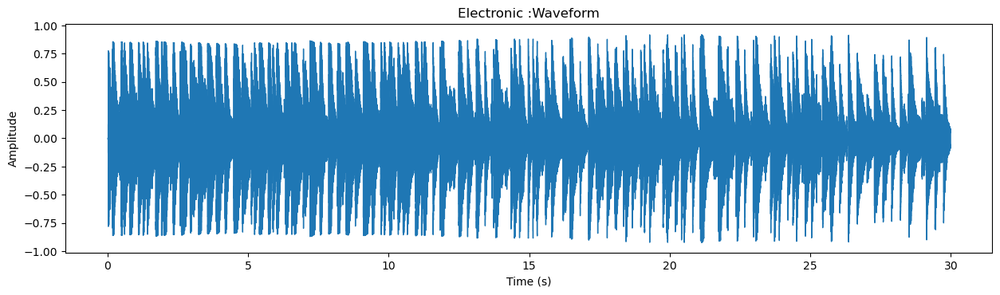

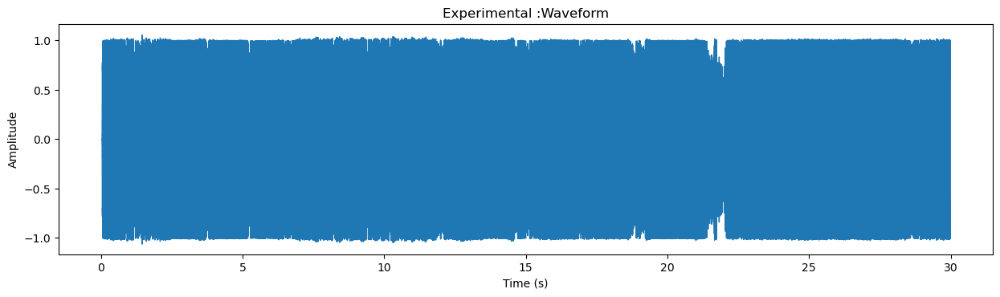

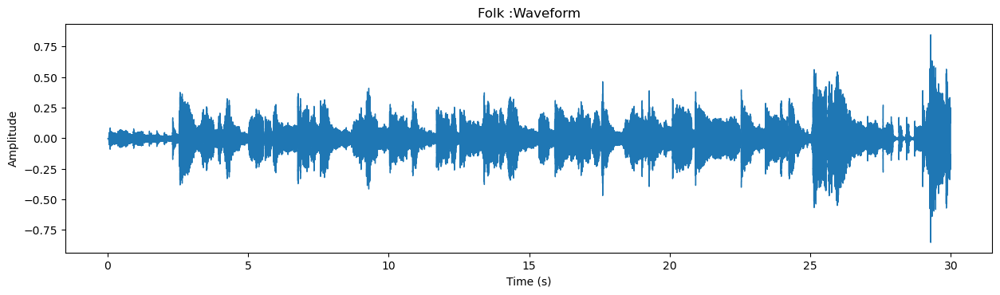

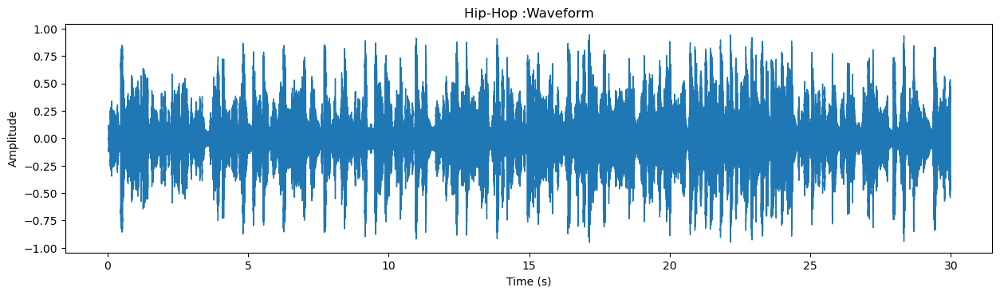

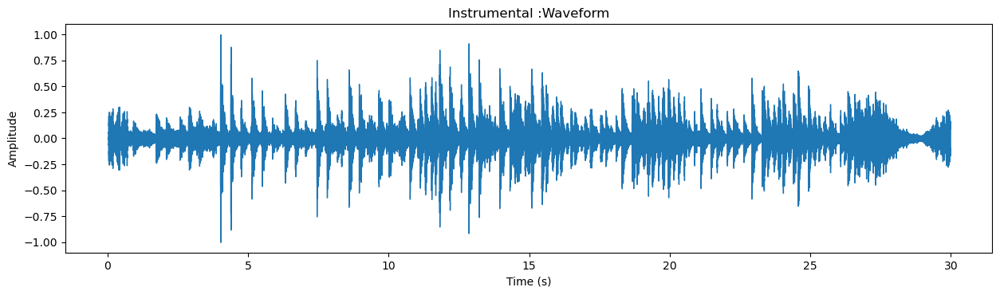

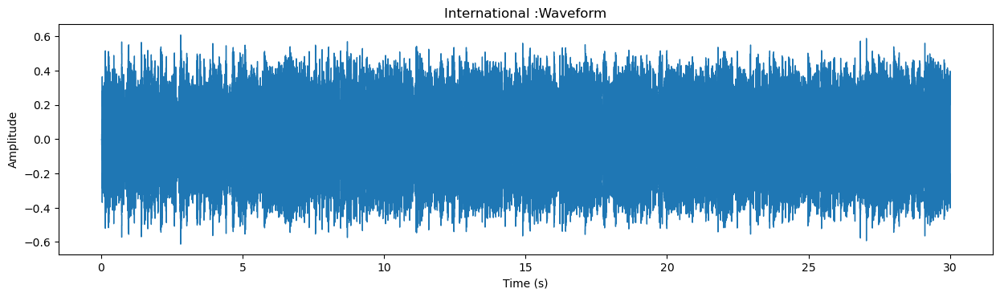

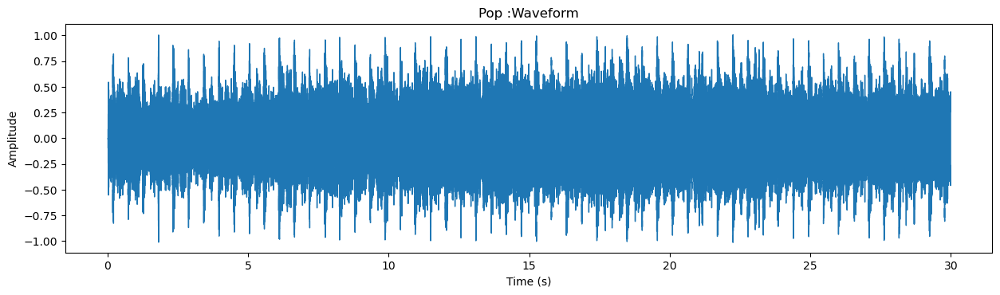

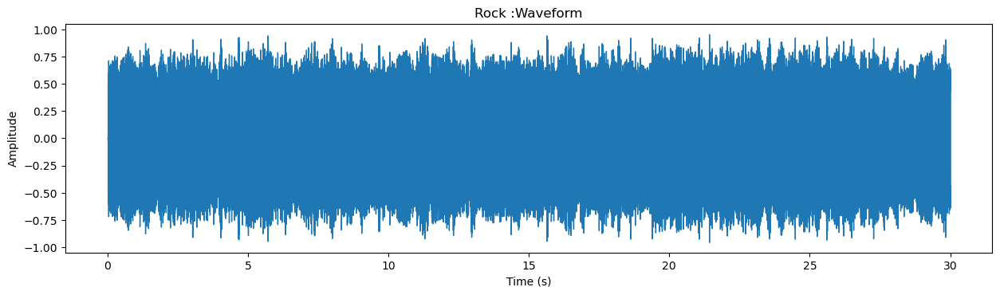

In [71]:
for _ in range(len(grouped_df)):
    genre_type = grouped_df[("track", "genre_top")].iloc[_]
    track_id = grouped_df["track_id"].iloc[_]
    filename = get_audio_path(FMA_SMALL_PATH, track_id)
    plot_no = _+1
    plot_waveform_batch(filename, genre_type, 8, plot_no, 8, 1)

# **Spectrum Plots for all Genres**

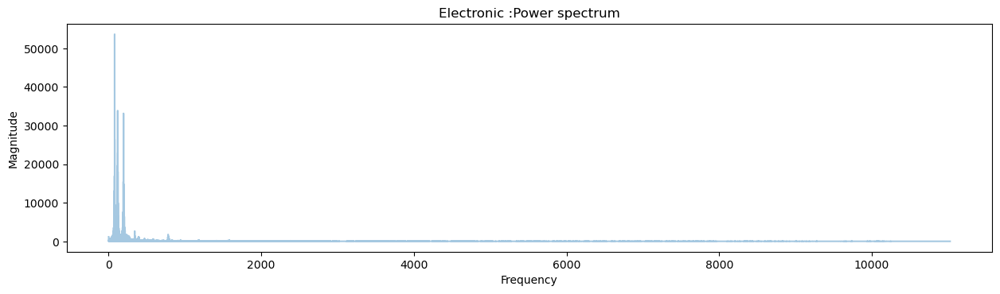

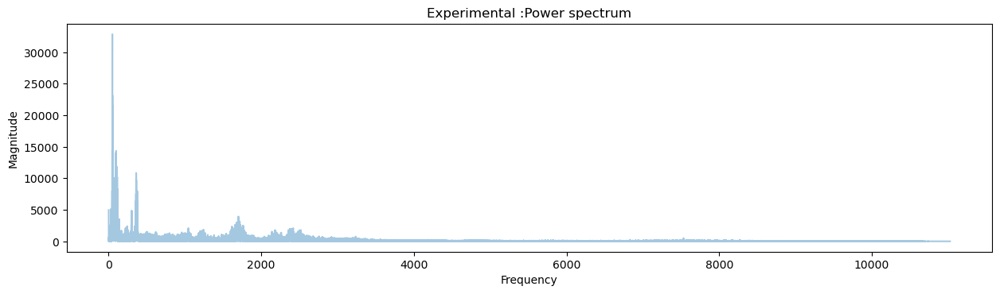

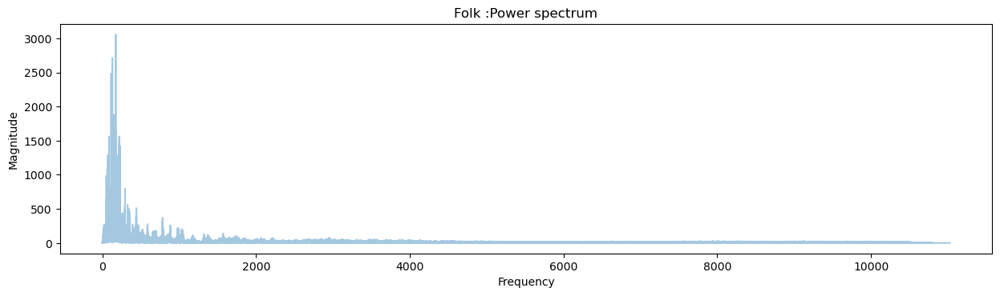

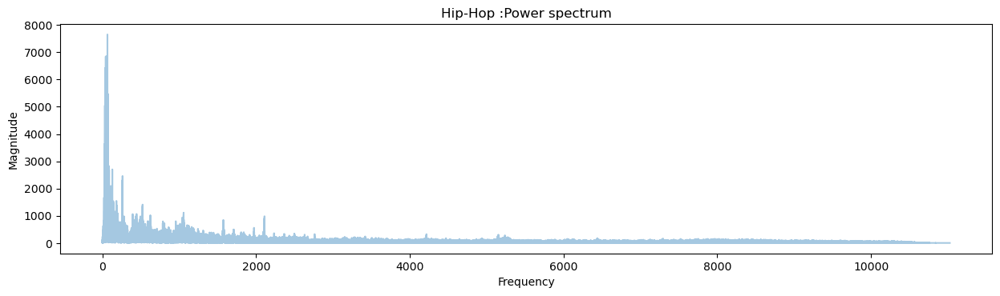

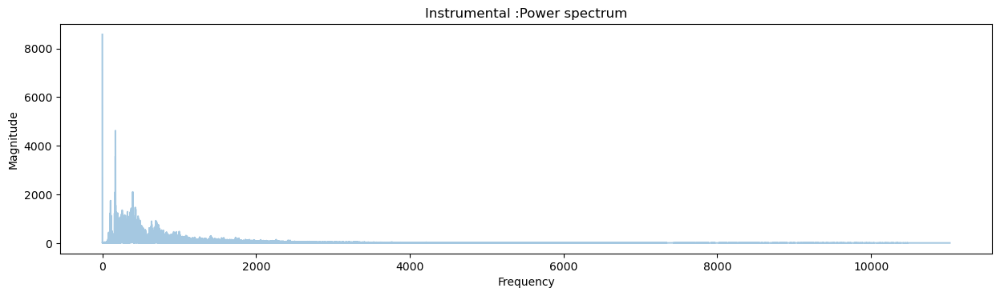

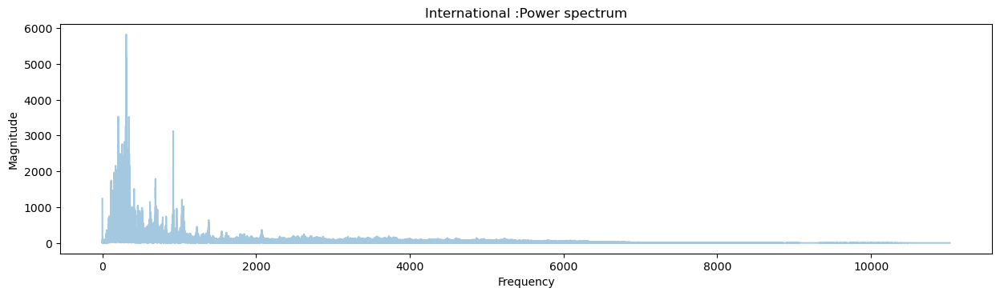

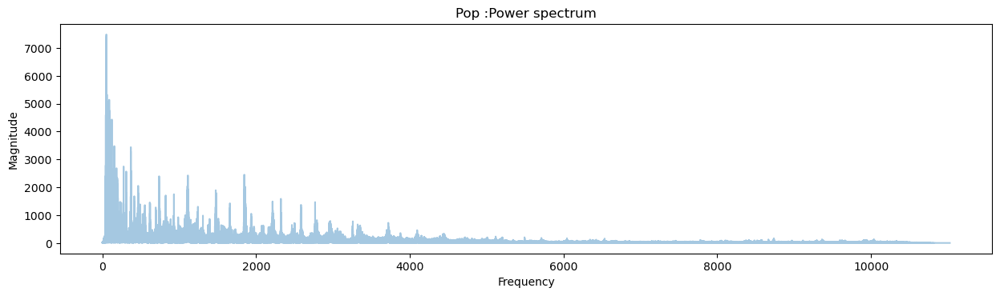

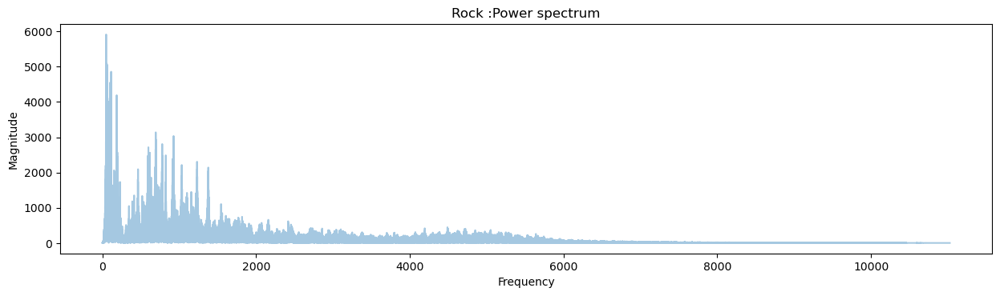

In [72]:
for _ in range(len(grouped_df)):
    genre_type = grouped_df[("track", "genre_top")].iloc[_]
    track_id = grouped_df["track_id"].iloc[_]
    filename = get_audio_path(FMA_SMALL_PATH, track_id)
    plot_no = _+1
    plot_spectrum_batch(filename, genre_type, 8, plot_no, 8, 1)

# **Spectrogram plots for all Genres**

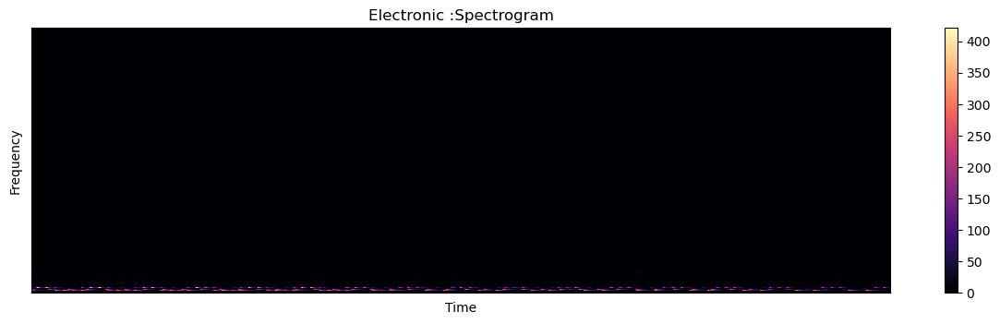

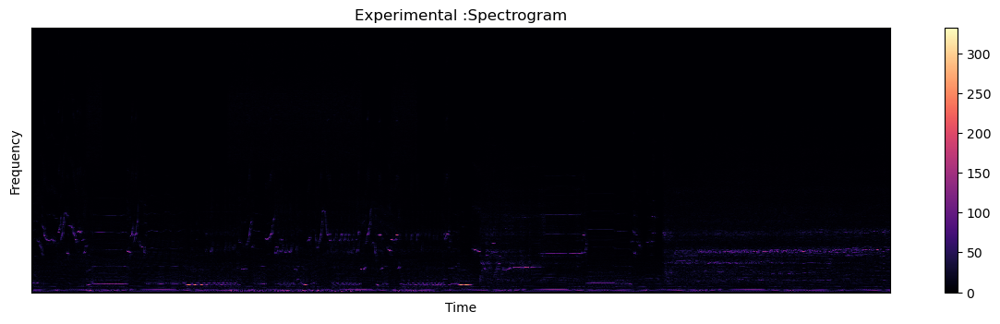

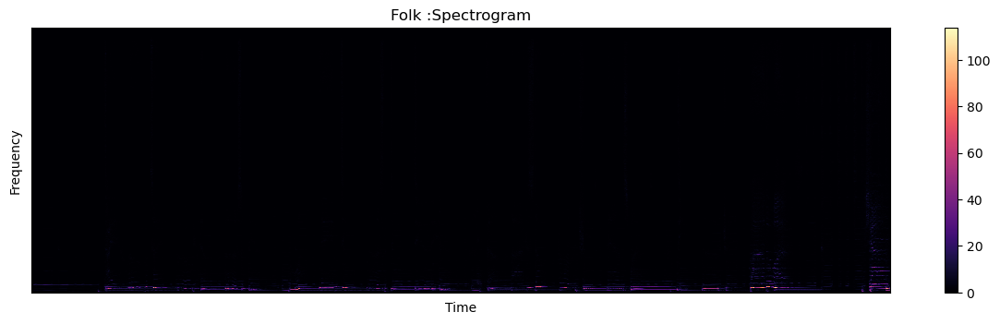

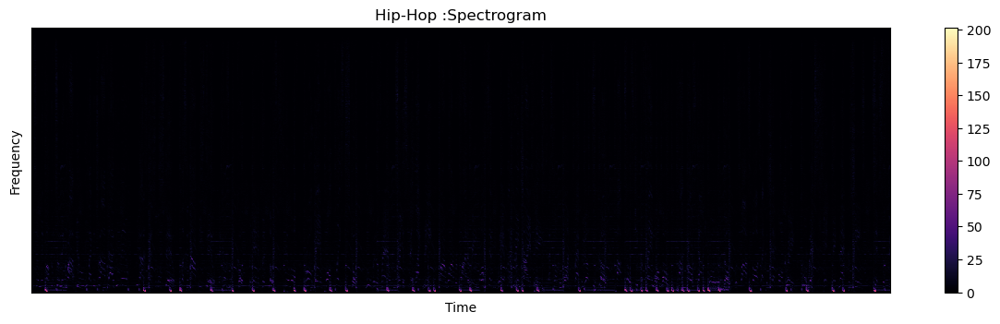

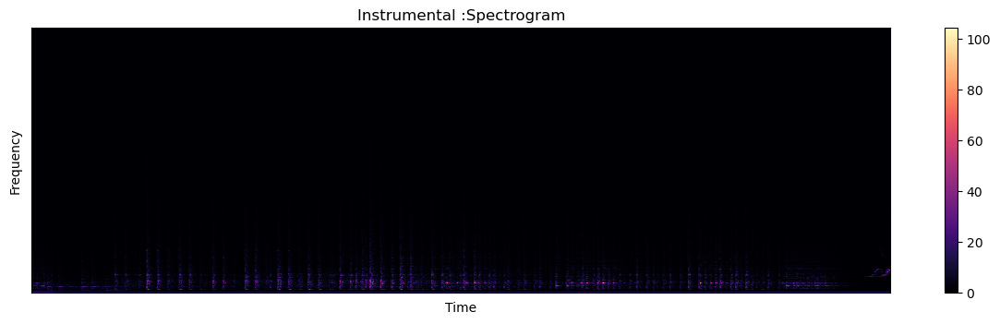

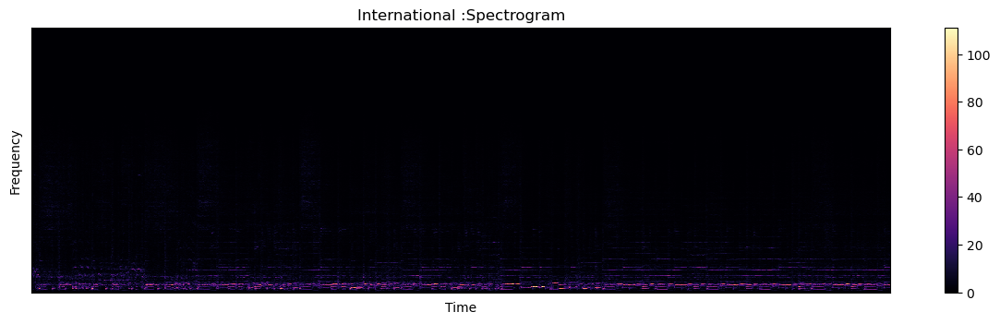

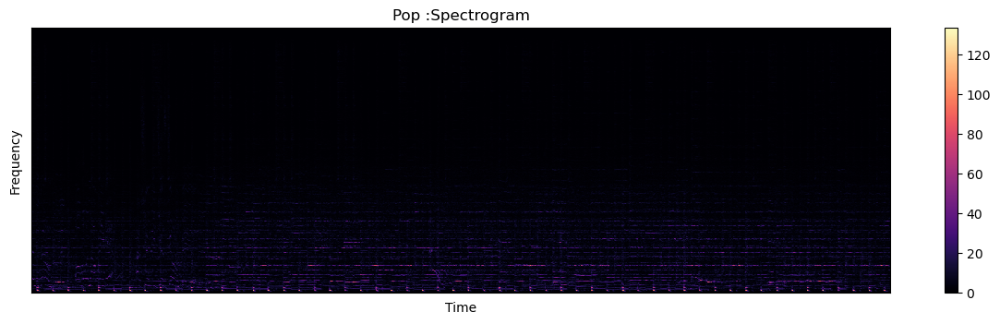

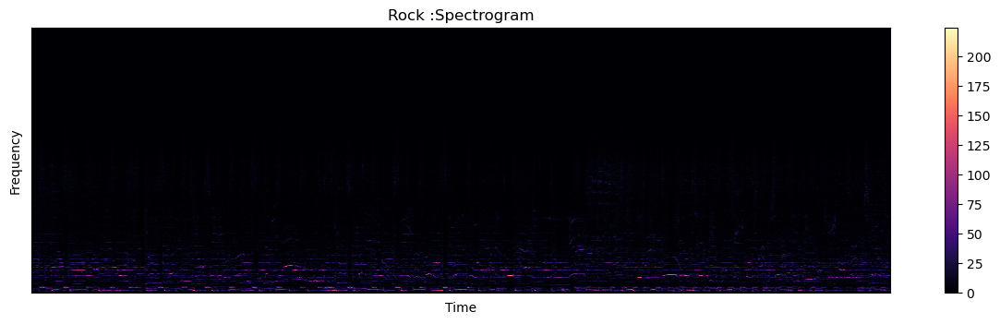

In [78]:
for _ in range(len(grouped_df)):
    genre_type = grouped_df[("track", "genre_top")].iloc[_]
    track_id = grouped_df["track_id"].iloc[_]
    filename = get_audio_path(FMA_SMALL_PATH, track_id)
    plot_no = _+1
    plot_spectrogram_batch(filename, genre_type, 8, plot_no, 8, 1)

# **Log Spectrogram for all Genres**

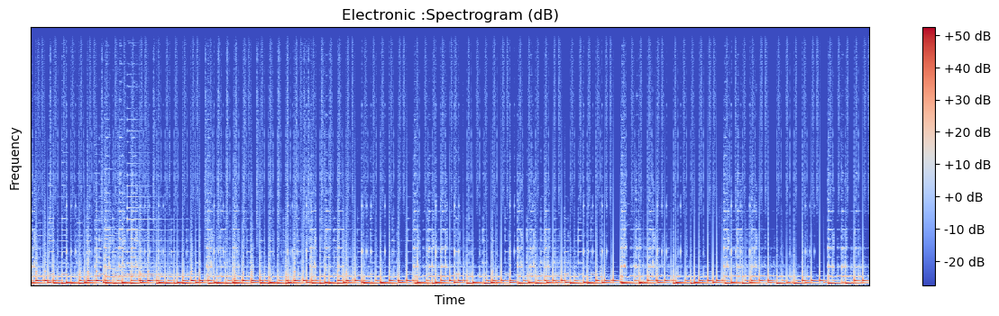

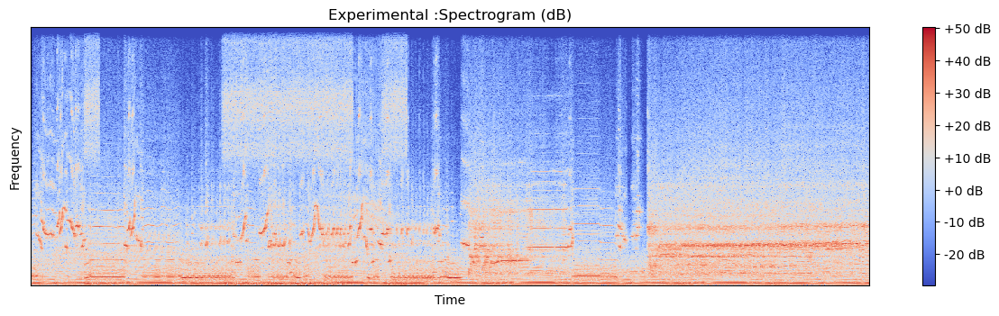

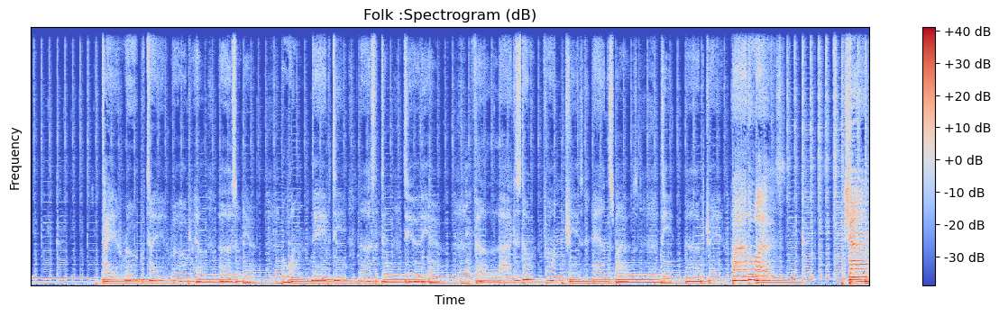

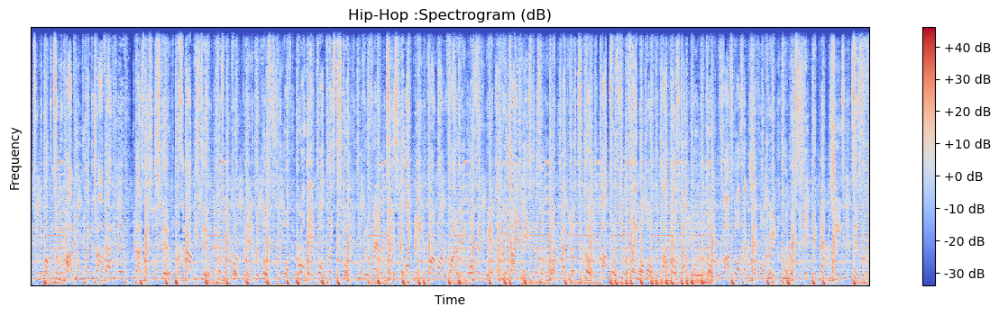

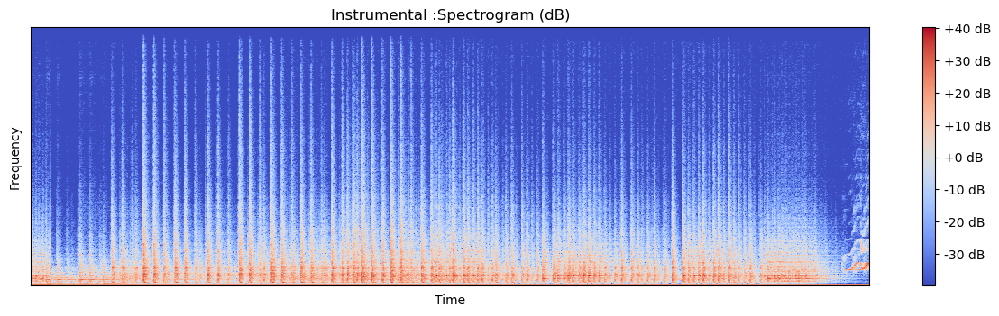

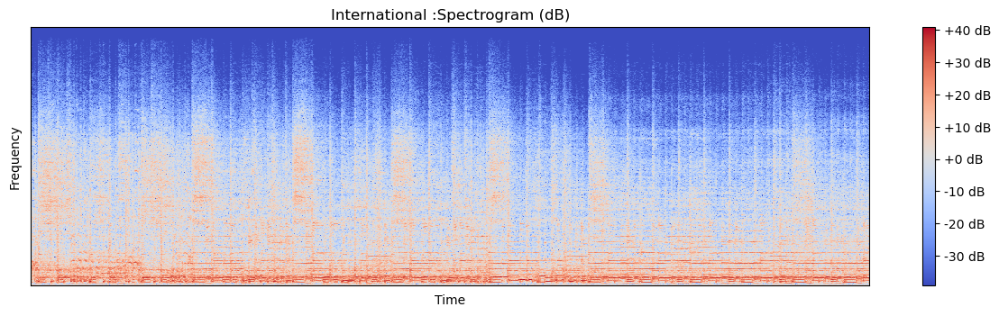

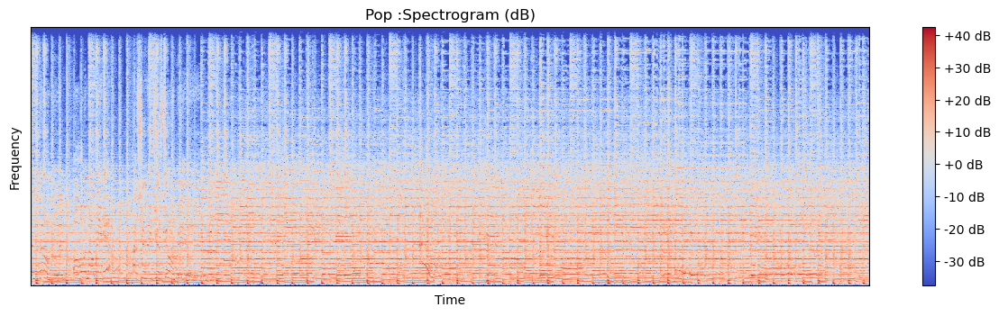

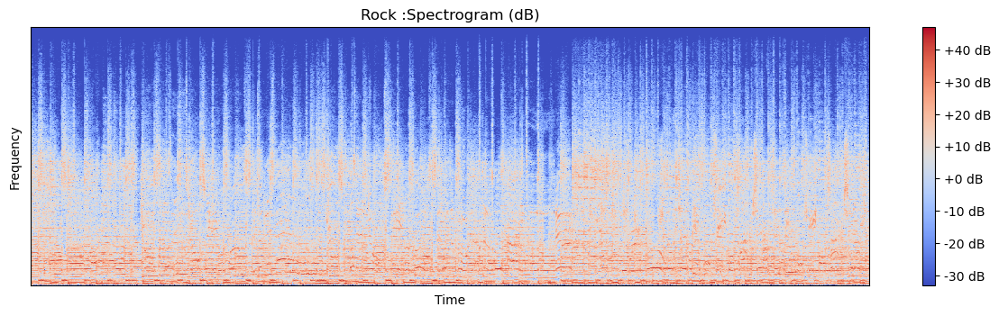

In [79]:
for _ in range(len(grouped_df)):
    genre_type = grouped_df[("track", "genre_top")].iloc[_]
    track_id = grouped_df["track_id"].iloc[_]
    filename = get_audio_path(FMA_SMALL_PATH, track_id)
    plot_no = _+1
    plot_log_spectrogram_batch(filename, genre_type, 8, plot_no, 8, 1)

# **MFCC plots for all genres**

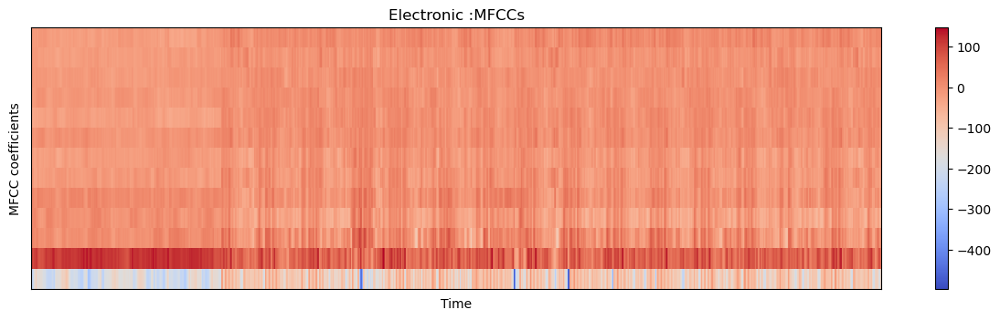

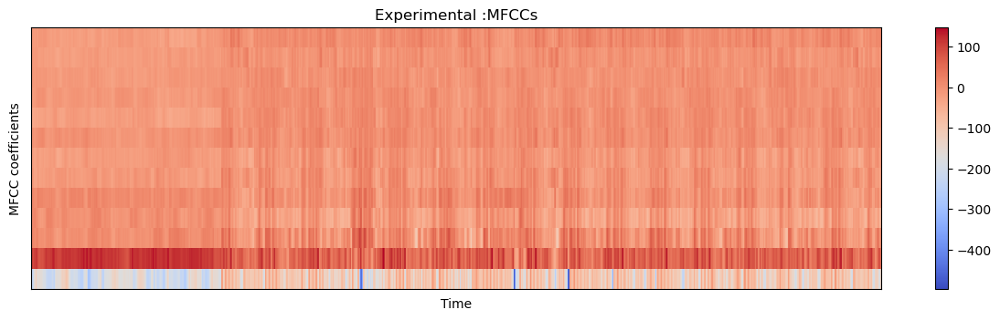

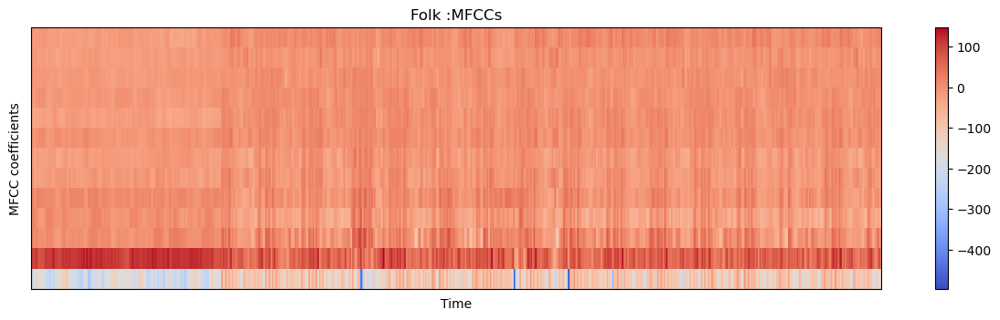

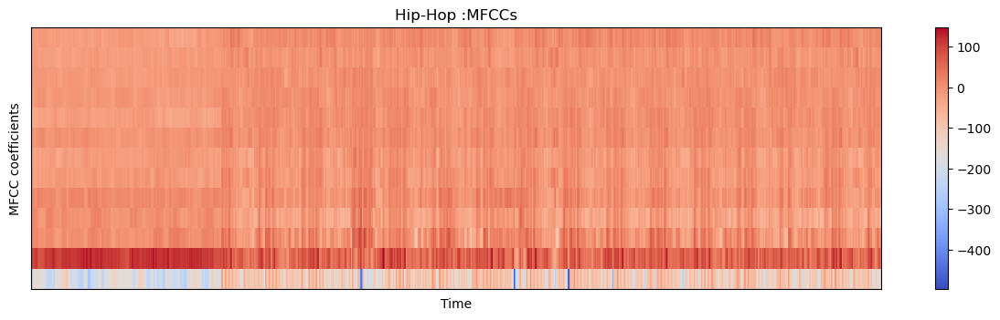

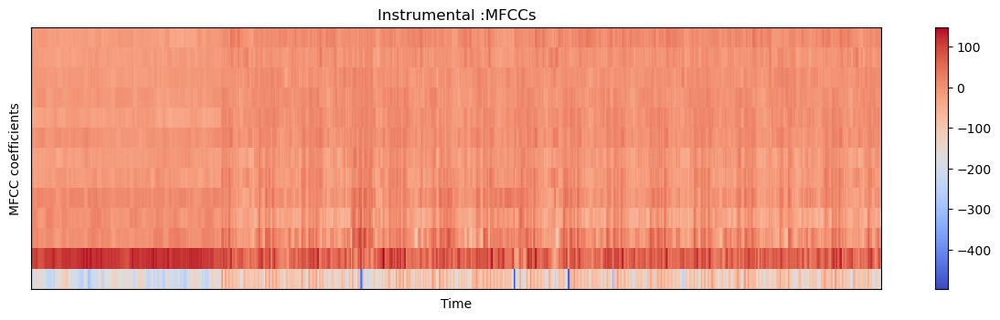

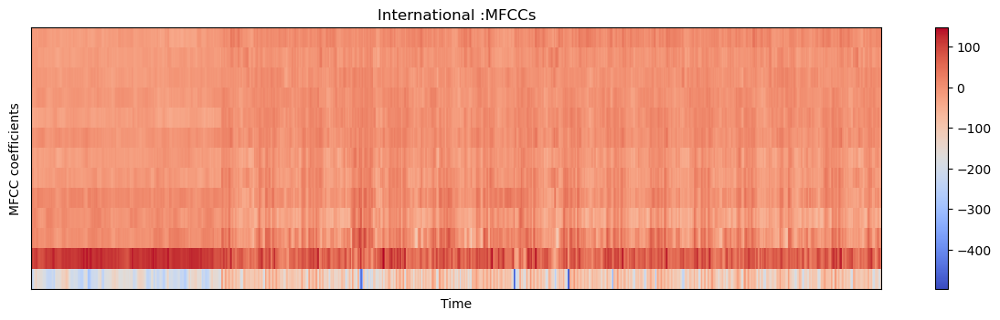

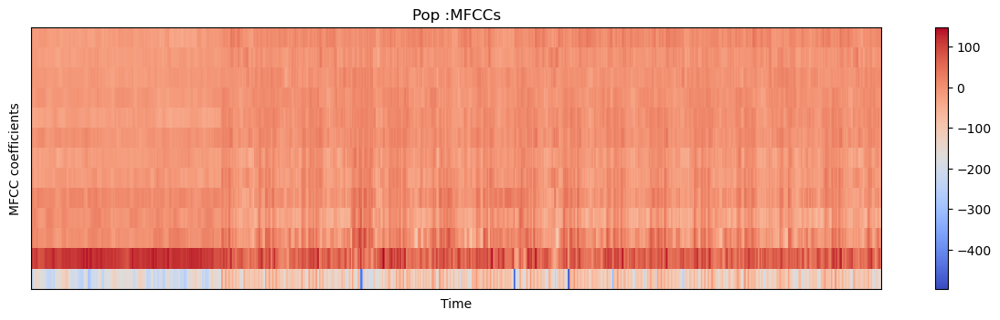

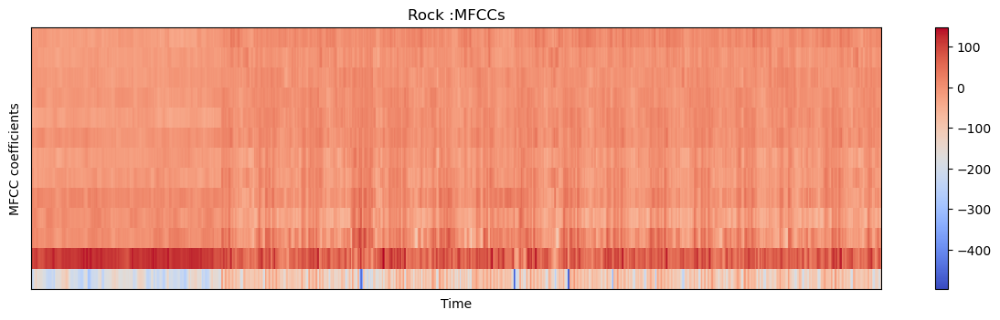

In [80]:
for _ in range(len(grouped_df)):
    genre_type = grouped_df[("track", "genre_top")].iloc[_]
    track_id = grouped_df["track_id"].iloc[_]
    filename = get_audio_path(FMA_SMALL_PATH, track_id)
    plot_no = _+1
    plot_mfcc_batch(filename, genre_type, 8, plot_no, 8, 1)